In [71]:
# WE SHOULD
# %run generic.ipynb
# But -> 

In [72]:
# COPY & PASTE from first.ipynb
# Generic Imports
import numpy as np 
from PIL import Image 
import scipy.io as sio
import matplotlib.pyplot as plt

In [73]:
# COPY & PASTE from first.ipynb
# Generic Imports
from enum import StrEnum # Enum Implementation for Robustness

class Categories(StrEnum):
    Car = "Car"
    Duck = "Duck"
    Face = "Face"
    Motorbike = "Motorbike"
    Winebottle = "Winebottle"

In [74]:
# COPY & PASTE from first.ipynb
# Generic Imports
import glob # For searching files
import os # To remove file extension

# Constants
DATA_PATH: str = "./../data/WillowObject/WILLOW-ObjectClass/"

# 1. Gets Information
def getting(cat: Categories, n: int) -> list[tuple[Image.Image, np.array]]:
    images: list[str] = glob.glob(f"{DATA_PATH}{cat.value}/*.png")
    points: list[str] = glob.glob(f"{DATA_PATH}{cat.value}/*.mat")
    pairs = []
    set_points = set(points)

    for img_file in images:
        base, _ = os.path.splitext(img_file)
        mat_file = base + ".mat"
        if mat_file in set_points:
            img = Image.open(img_file)
            kps = np.array(sio.loadmat(mat_file)['pts_coord'])
            pairs.append((img, kps))
            if len(pairs) >= n:
                break

    return pairs

In [75]:
# COPY & PASTE from first.ipynb
# Constants
RESIZE: int = 256
# 2. Resizes Values
def resizing(tup: tuple[Image.Image, np.array]) -> tuple[Image.Image, np.array]:
    img, kps = tup
    kps[0] *= RESIZE / img.size[0]
    kps[1] *= RESIZE / img.size[1]

    img = img.resize((RESIZE, RESIZE), resample=Image.BILINEAR)

    return (img, kps)

In [76]:
# Generic Imports
from scipy.spatial import Delaunay

def delaunay_graph(kpts: np.array):
    points = list(zip(kpts[0], kpts[1]))
    tri = Delaunay(points)
    edges = []

    for simplex in tri.simplices:
        for i in range(len(simplex)):
            for j in range(i + 1, len(simplex)):
                edges.append((simplex[i], simplex[j]))

    return list(set(tuple(sorted(e)) for e in edges))


In [77]:
# Generic Imports
import math

def knn_graph(kpts, k) -> list[tuple[int, int]]:
    # Initialize the Matrix where we store distances
    distance_matrix: list[list[float]] = []
    # We calculate the distance from each point to another
    points = list(zip(kpts[0], kpts[1]))
    for i, point in enumerate(points):
        # We initialize the array where we will store the distances for each point
        distance_array: list[float] = []
        # IMPORTANT: i and j are point indexes
        for j, other in enumerate(points):
            distance = math.sqrt((point[0]-other[0])**2 + (point[1]-other[1])**2) # Eucleadian distance
            distance_array.append((distance, j))
        distance_array.sort(key=lambda dist: dist[0])
        distance_matrix.append(distance_array.copy())
    
    # Initialize the Result Variable
    edges: list[tuple[int, int]] = []
    # We append the Edges (Each Row's Index ~ Point Index)
    for i, array in enumerate(distance_matrix):
        array = array[1:k+1] # Skip the distance to itself
        for element in array:
            edges.append((i, element[1])) # Build and append the array
                            
    return list(edges)

In [78]:
def plot_image_with_graph(img, kpt, edges):
    plt.imshow(img)
    plt.scatter(kpt[0], kpt[1], c='w', edgecolors='k')
    
    for i, j in edges:
        plt.plot([kpt[0, i], kpt[0, j]], [kpt[1, i], kpt[1, j]], 'r-')

def visualize(imgs: list[tuple[Image.Image, np.array]]):
    n = len(imgs)
    if n > 1:
        width = 8
        cols = 2
    else:
        width = 4
        cols = 1
    rows = math.ceil(n / cols)
    height = rows * 4
    
    plt.figure(figsize=(width, height))
    for i, img in enumerate(imgs):
        plt.subplot(rows, cols, i +1)
        im, kpt, edges = img
        plot_image_with_graph(im, kpt, edges)

In [79]:
# The Main Function
def show_delaunay(cat: Categories, n: int = 4):
    pairs = getting(cat, n) # Gets
    pairs = [resizing(p) for p in pairs] # Resizes
    triplets = [(pair[0], pair[1], delaunay_graph(pair[1])) for pair in pairs]
    visualize(triplets) # And plots

In [80]:
# The Main Function
def show_knn(cat: Categories, n: int = 4, k: int = 3):
    pairs = getting(cat, n) # Gets
    pairs = [resizing(p) for p in pairs] # Resizes
    triplets = [(pair[0], pair[1], knn_graph(pair[1], k)) for pair in pairs]
    visualize(triplets)

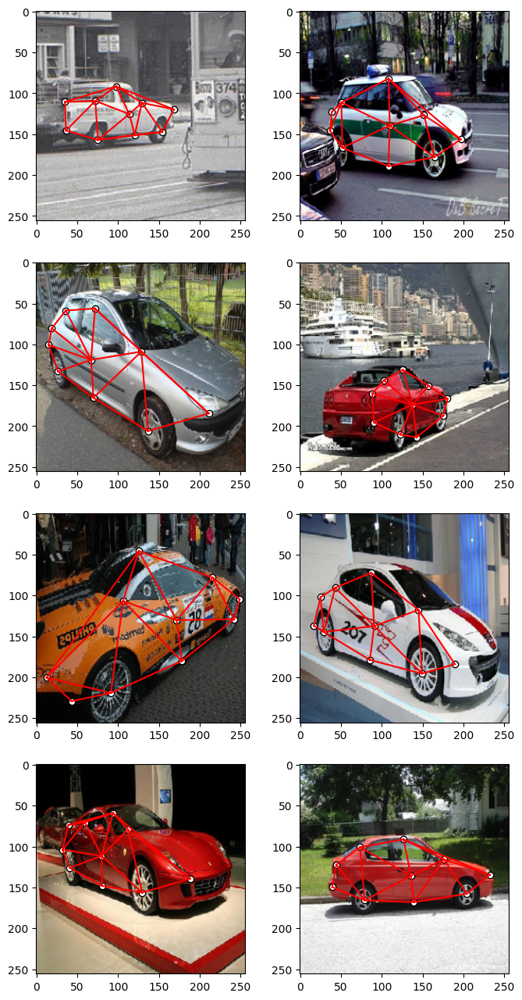

In [81]:
show_delaunay(Categories.Car, 8)

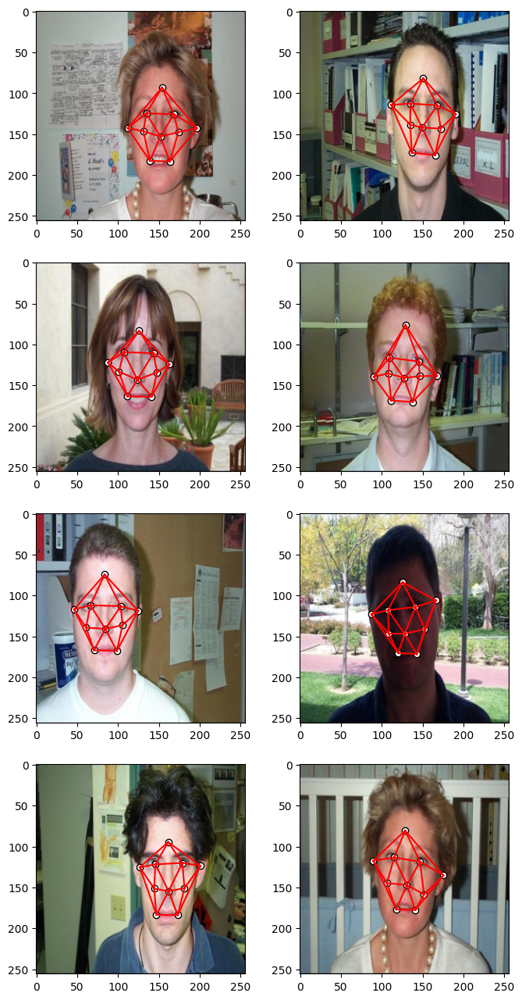

In [82]:
show_delaunay(Categories.Face, 8)

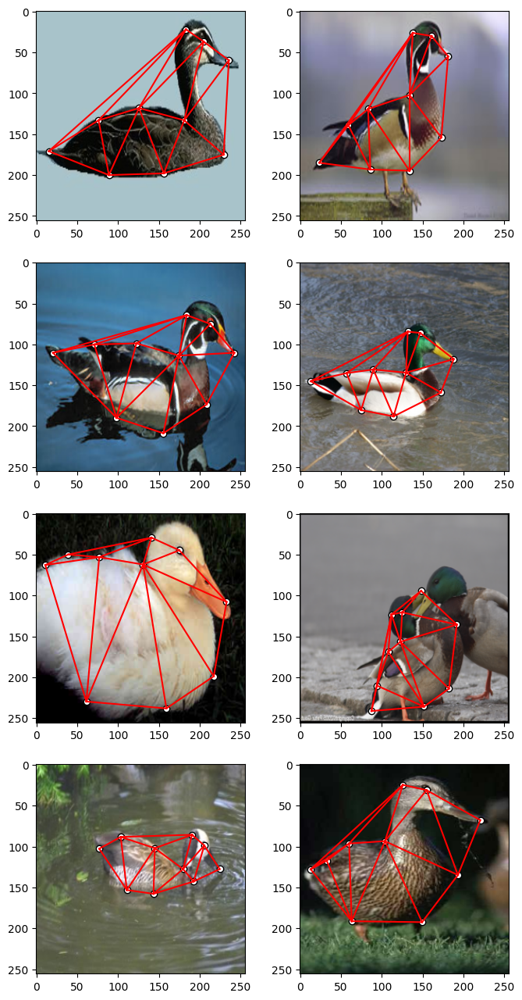

In [83]:
show_delaunay(Categories.Duck, 8)

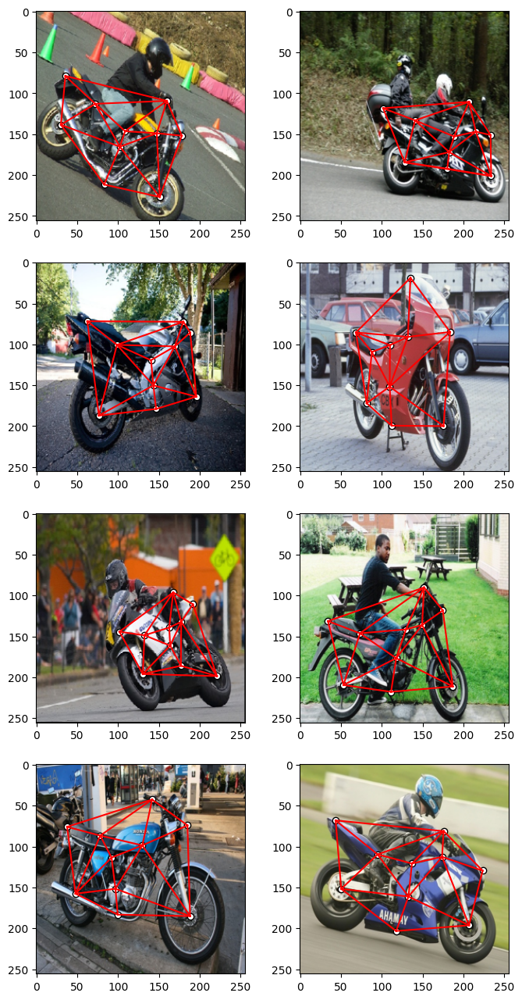

In [84]:
show_delaunay(Categories.Motorbike, 8)

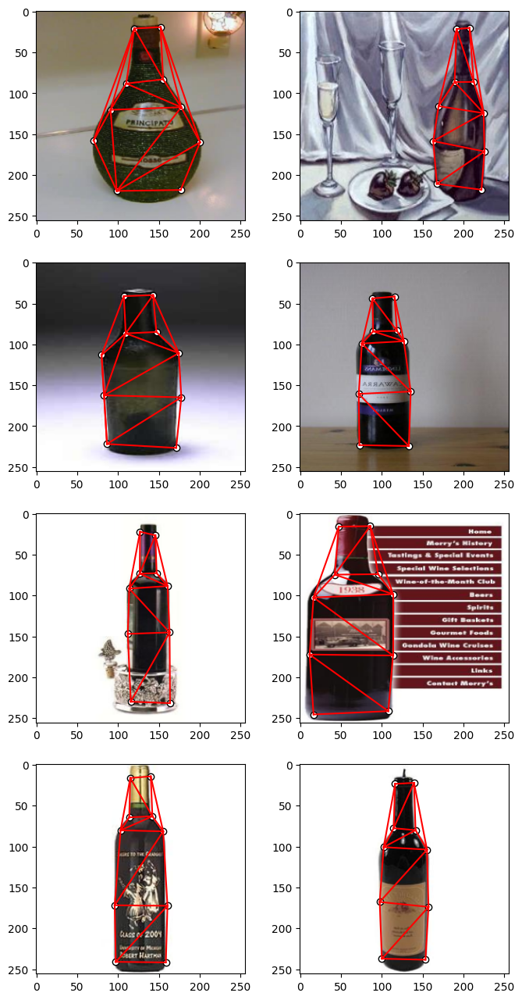

In [85]:
show_delaunay(Categories.Winebottle, 8)

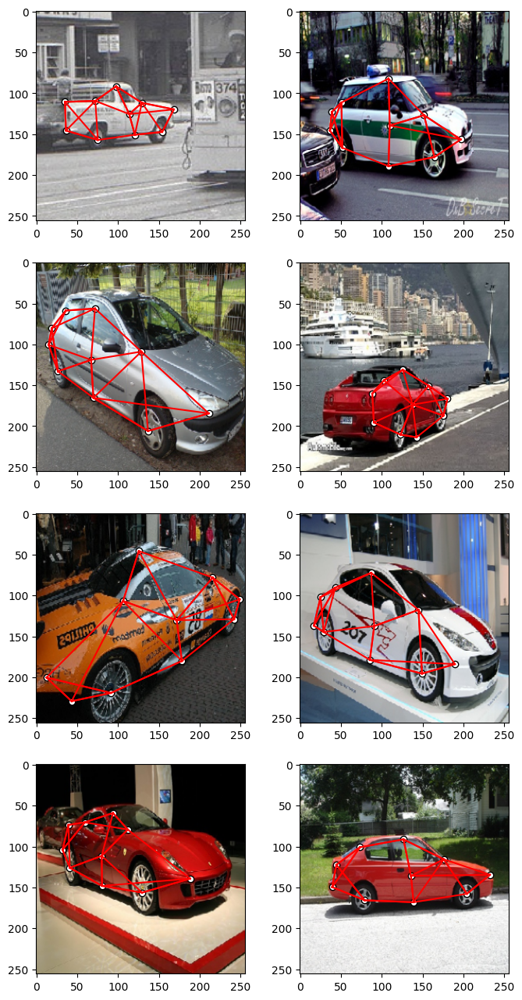

In [86]:
show_knn(Categories.Car, 8, 3)

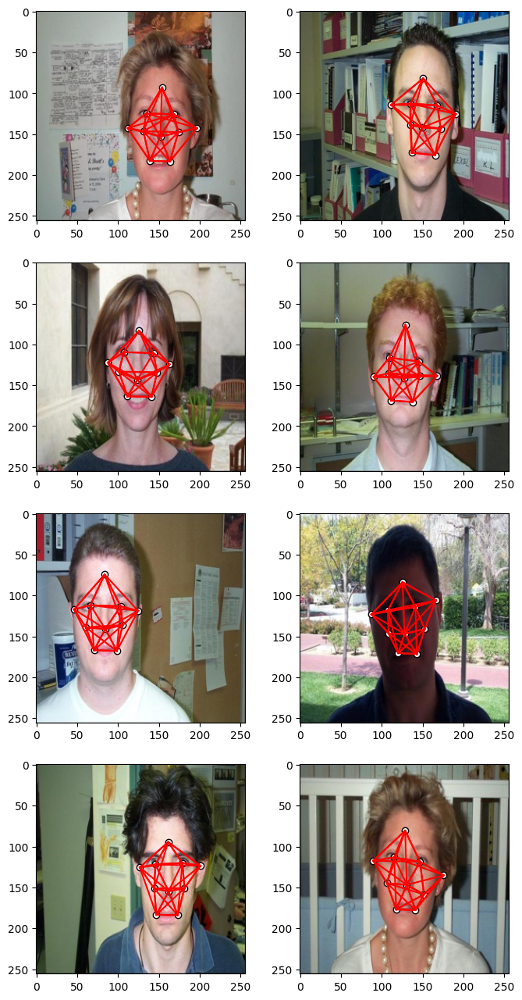

In [87]:
show_knn(Categories.Face, 8, 5)

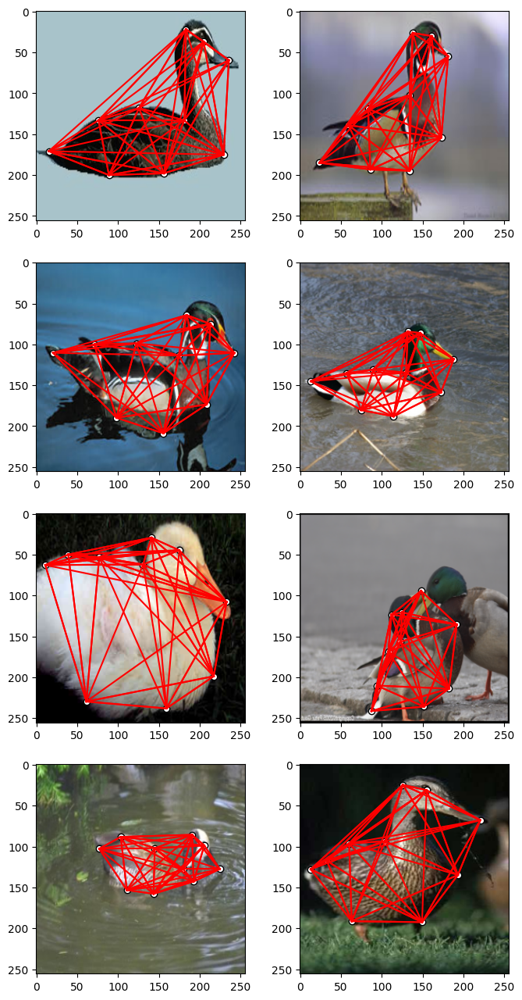

In [88]:
show_knn(Categories.Duck, 8, 7)

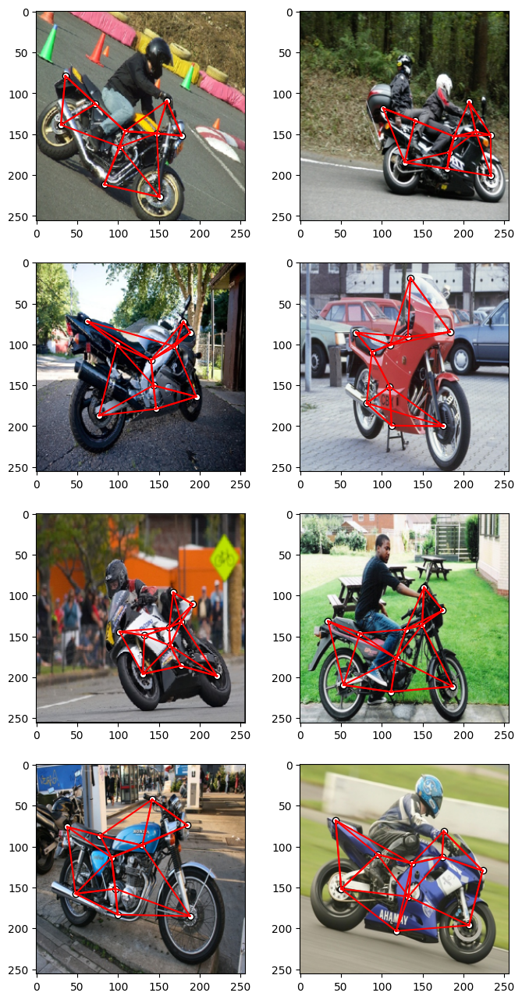

In [89]:
show_knn(Categories.Motorbike, 8, 3)

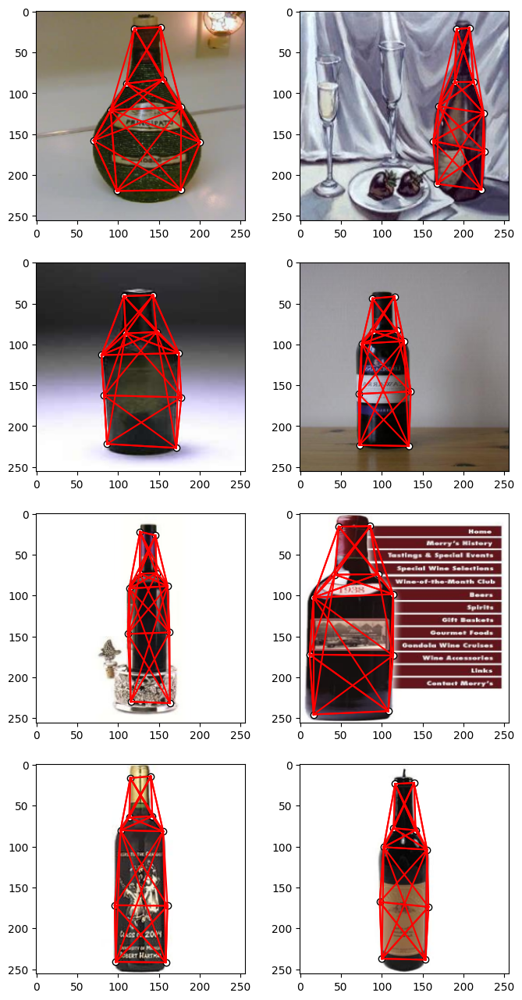

In [90]:
show_knn(Categories.Winebottle, 8, 5)